# **Importing Data**

In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Rescaling
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout,GlobalAveragePooling2D
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.applications import InceptionV3
from sklearn.metrics import confusion_matrix
import seaborn as sns
from tensorflow.keras.preprocessing import image
import os
import PIL
from PIL import Image
from IPython.display import display
from glob import glob
import random
import cv2
import warnings
warnings.simplefilter('ignore')

In [2]:
train_dir = '/kaggle/input/fairface-race/FairFace Race/train'
val_dir = '/kaggle/input/fairface-race/FairFace Race/val'
img_size = (224, 224)  
batch_size = 32
## identifying 4 classes 
class_names_to_include = ['Black','East Asian','White']
# Load the training dataset
train_dataset = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    image_size=img_size,
    batch_size=batch_size,
    label_mode='int',
    shuffle=True,  
    class_names=class_names_to_include
)

# Load the validation dataset
val_dataset = tf.keras.utils.image_dataset_from_directory(
    val_dir,
    image_size=img_size,
    batch_size=batch_size,
    label_mode='int',
    shuffle=True,
    class_names=class_names_to_include
)


Found 41047 files belonging to 3 classes.
Found 5191 files belonging to 3 classes.


In [3]:
import numpy as np
import matplotlib.pyplot as plt

def plot_dist(train_dataset, class_names):
    class_counts = np.zeros(len(class_names))
    for images, labels in train_dataset:
        # Convert labels to numpy array and flatten it
        labels = labels.numpy().flatten()
        for label in labels:
            class_counts[label] += 1

    plt.figure(figsize=(10, 5))
    plt.bar(class_names, class_counts)
    plt.title('Class Distribution in Training Dataset')
    plt.xlabel('Classes')
    plt.ylabel('Number of Images')
    plt.xticks(rotation=45)
    plt.grid(axis='y')
    plt.show()





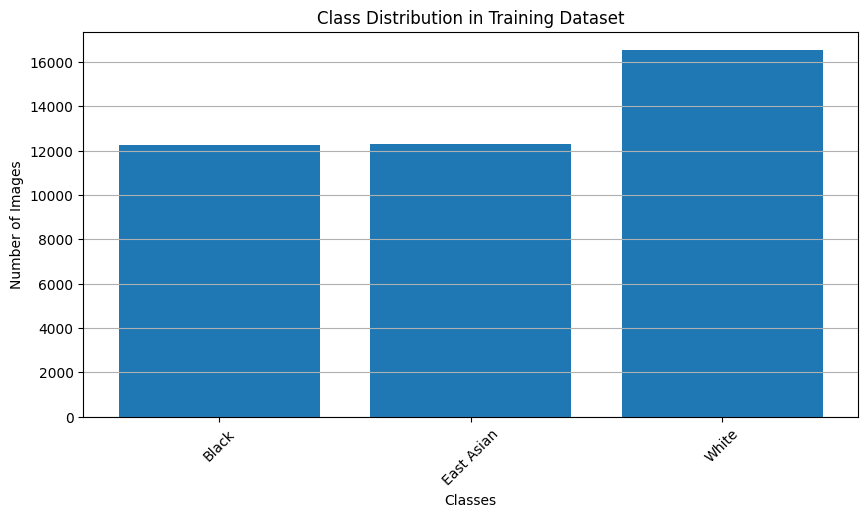

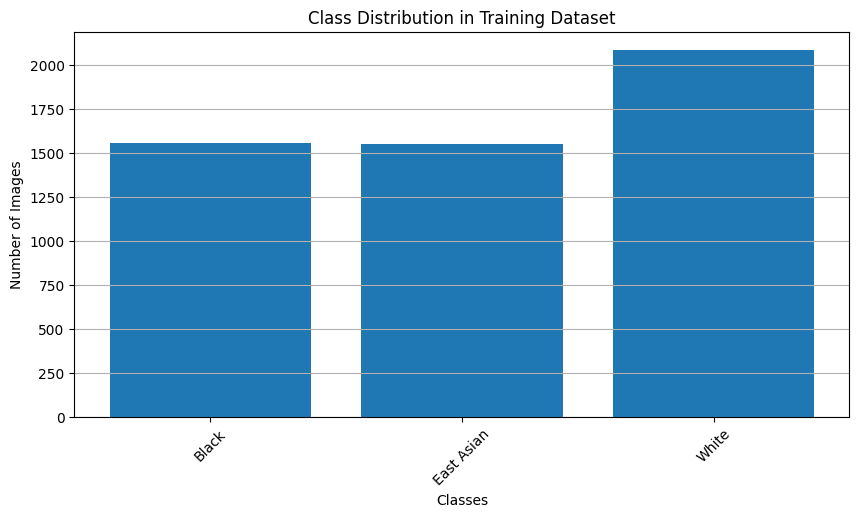

In [4]:
plot_dist(train_dataset, class_names_to_include)
plot_dist(val_dataset, class_names_to_include)

**We have balanced class except for white we have more data**

In [5]:
# Getting the first batch of data
for images, labels in train_dataset.take(1):
    print("Images shape:", images.shape)  # Shape of the images
    print("Labels shape:", labels.shape)   # Shape of the labels
    print("Batch of images:", images.numpy())  # Array of image data
    print("Batch of labels:", labels.numpy())  # Corresponding labels


Images shape: (32, 224, 224, 3)
Labels shape: (32,)
Batch of images: [[[[170.   112.    39.  ]
   [170.   112.    38.  ]
   [167.5  111.5   34.5 ]
   ...
   [208.   158.    61.  ]
   [209.   159.    62.  ]
   [209.75 159.75  62.75]]

  [[170.5  112.5   39.25]
   [170.5  112.5   38.5 ]
   [167.75 111.75  34.75]
   ...
   [208.75 158.75  61.75]
   [209.75 159.75  62.75]
   [210.   160.    63.  ]]

  [[171.   113.    39.  ]
   [171.25 114.    37.75]
   [168.75 112.75  35.75]
   ...
   [209.75 159.75  62.75]
   [210.25 160.25  65.25]
   [211.   161.    66.  ]]

  ...

  [[  2.     2.     2.  ]
   [  2.     2.     2.  ]
   [  2.     2.     2.  ]
   ...
   [125.    16.    11.5 ]
   [128.25  13.    10.  ]
   [132.5   14.    10.  ]]

  [[  2.     2.     2.  ]
   [  2.     2.     2.  ]
   [  2.     2.     2.  ]
   ...
   [126.25  15.25  13.  ]
   [129.75  12.    10.  ]
   [135.5   12.5   12.  ]]

  [[  2.     2.     2.  ]
   [  2.     2.     2.  ]
   [  2.     2.     2.  ]
   ...
   [126.5   15

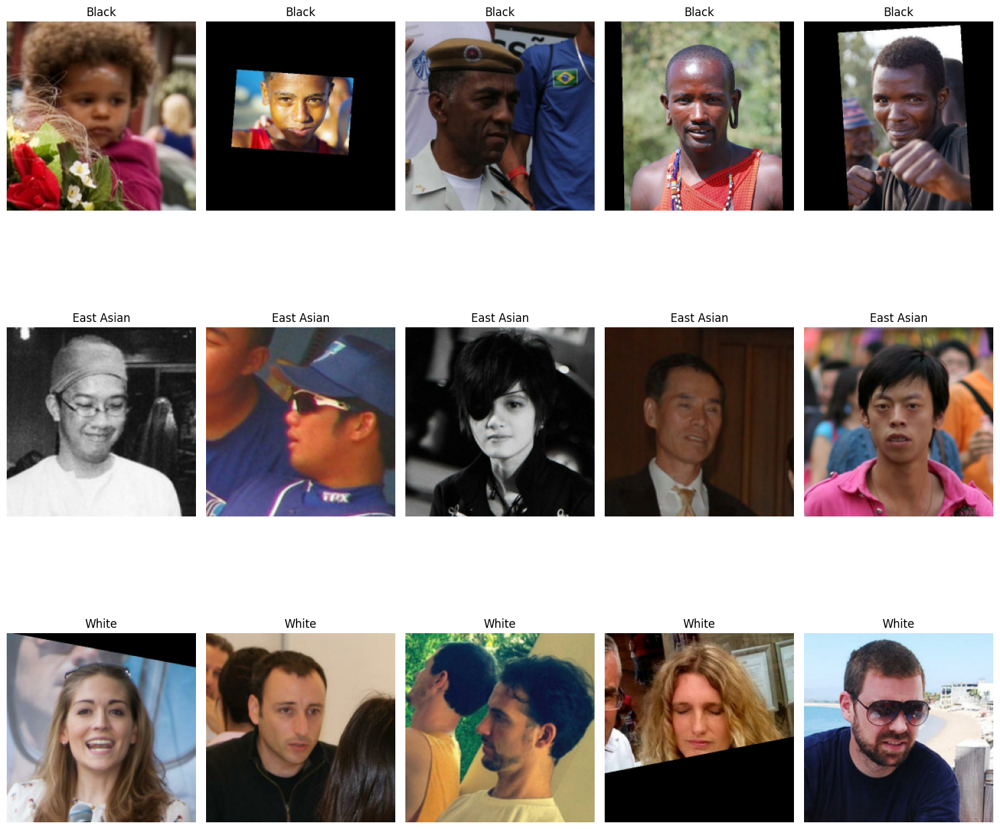

In [6]:
import matplotlib.pyplot as plt
import numpy as np

# Function to plot a few images from each class
def plot_images_from_each_class(dataset, class_names, num_images=5):
    # Create a dictionary to store images from each class
    class_images = {class_name: [] for class_name in class_names}

    # Iterate through the dataset to collect images from each class
    for images, labels in dataset.take(100):  # Limit the number of batches for efficiency
        for i, label in enumerate(labels):
            class_name = class_names[label]
            if len(class_images[class_name]) < num_images:
                # Add image to the corresponding class
                image_array = images[i].numpy()
#                 image_array = (image_array * 255).astype('uint8')
                class_images[class_name].append(image_array)

        # Stop when we have enough images for each class
        if all(len(class_images[class_name]) >= num_images for class_name in class_names):
            break

    # Plot the images from each class
    plt.figure(figsize=(15, 15))
    for i, class_name in enumerate(class_names):
        for j in range(num_images):
            plt.subplot(len(class_names), num_images, i * num_images + j + 1)
            plt.imshow(class_images[class_name][j].astype('uint8'))  # Ensure correct data type for display
            plt.title(class_name)
            plt.axis('off')

    plt.tight_layout()
    plt.show()


# Call the function to plot images from each class
plot_images_from_each_class(train_dataset, class_names_to_include)




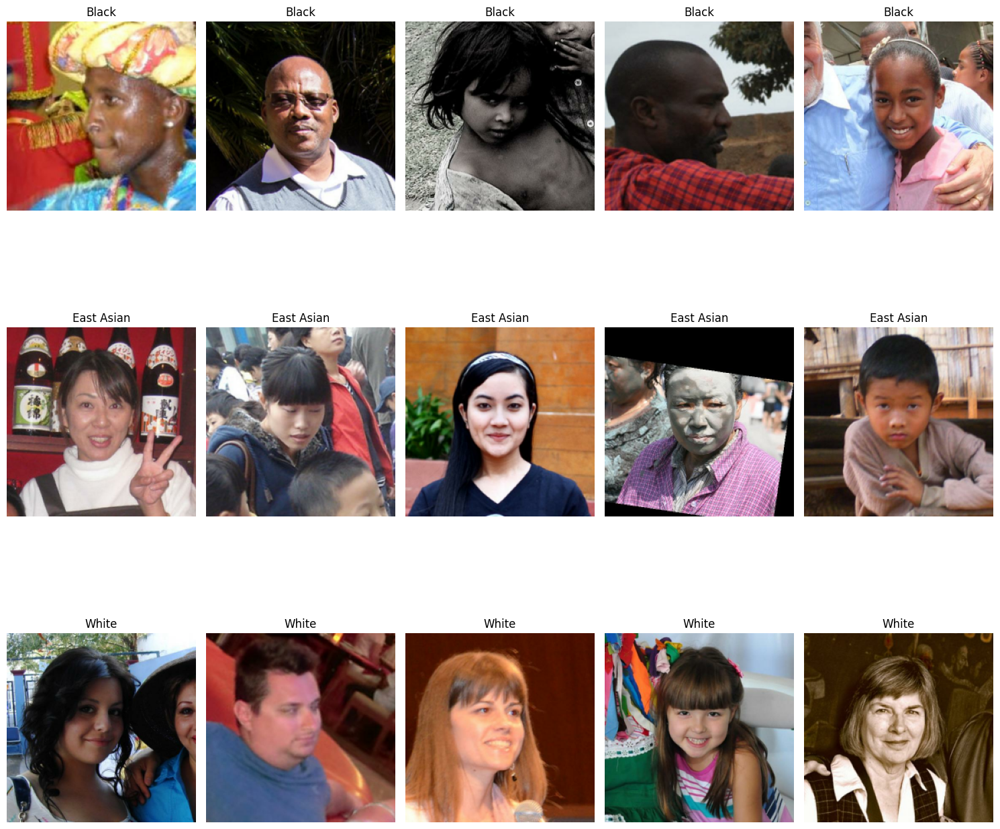

In [7]:
plot_images_from_each_class(val_dataset, class_names_to_include)

# **Training CNN**

In [8]:
def confusion(model) :
    val_images, val_labels = next(iter(val_dataset))
    predictions = np.argmax(model.predict(val_images), axis=1)
    cm = confusion_matrix(val_labels, predictions)
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names_to_include, yticklabels=class_names_to_include)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()


In [9]:
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

In [10]:
from tensorflow.keras.layers import Rescaling
train_dataset = train_dataset.map(lambda x, y: (Rescaling(1./255)(x), y))
val_dataset = val_dataset.map(lambda x, y: (Rescaling(1./255)(x), y))


In [11]:
    base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    for layer in base_model.layers:
        layer.trainable = False
    for layer in base_model.layers[-50:]:  # Unfreeze the last 20 layers
            layer.trainable = True
    last_layer = base_model.get_layer('mixed10')
    last_output = last_layer.output
    x = GlobalAveragePooling2D()(last_output)
    x = Dense(1024, activation='relu')(x)
    x = Dense(3, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=x)

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [12]:
model.compile(
    optimizer='adam', 
    loss='sparse_categorical_crossentropy', 
    metrics=['accuracy'] 
)

In [13]:
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=15,
    callbacks=[early_stopping]
)

Epoch 1/15


I0000 00:00:1727709528.635960      74 service.cc:145] XLA service 0x79f170002230 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1727709528.636036      74 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


   2/1283 ━━━━━━━━━━━━━━━━━━━━ 1:15 59ms/step - accuracy: 0.4297 - loss: 1.5214  

I0000 00:00:1727709539.961341      74 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_16', 4 bytes spill stores, 12 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_13', 4 bytes spill stores, 12 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_12', 4 bytes spill stores, 12 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_11', 4 bytes spill stores, 12 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_10', 4 bytes spill stores, 12 bytes spill loads

I0000 00:00:1727709539.980198      74 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1283/1283 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.7465 - loss: 0.6298

I0000 00:00:1727709610.008191      74 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_17', 4 bytes spill stores, 12 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_14', 4 bytes spill stores, 12 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_13', 4 bytes spill stores, 12 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_12', 4 bytes spill stores, 12 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_11', 4 bytes spill stores, 12 bytes spill loads



1283/1283 ━━━━━━━━━━━━━━━━━━━━ 108s 67ms/step - accuracy: 0.7465 - loss: 0.6297 - val_accuracy: 0.8316 - val_loss: 0.4162
Epoch 2/15
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 67s 52ms/step - accuracy: 0.8325 - loss: 0.4156 - val_accuracy: 0.8162 - val_loss: 0.4656
Epoch 3/15
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 67s 52ms/step - accuracy: 0.8700 - loss: 0.3298 - val_accuracy: 0.8226 - val_loss: 0.4836
Epoch 4/15
1283/1283 ━━━━━━━━━━━━━━━━━━━━ 67s 52ms/step - accuracy: 0.9038 - loss: 0.2479 - val_accuracy: 0.8083 - val_loss: 0.6166


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


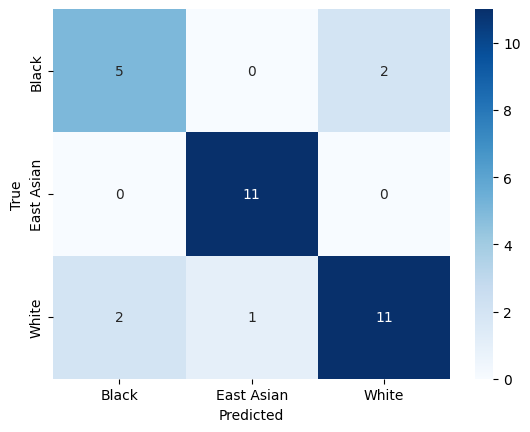

In [14]:
confusion(model)
  

In [15]:
model.save('race_classification_model.h5')

In [16]:
model = tf.keras.models.load_model("/kaggle/working/race_classification_model.h5")

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


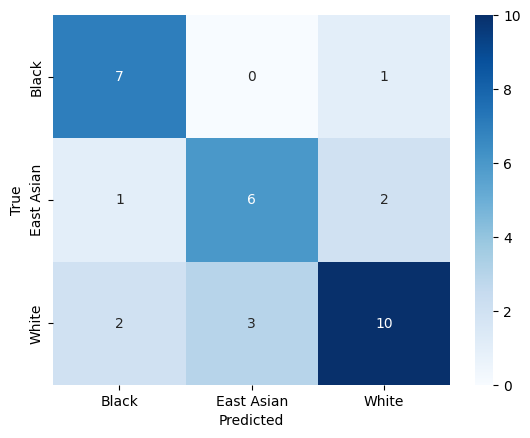

In [17]:
confusion(model)

In [18]:
def plot_loss(history) :
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(loc='upper right')
    plt.grid(True)
    plt.show()

    # Evaluate the model
    val_loss, val_accuracy = model.evaluate(val_dataset, verbose=1)
    print(f"Validation Loss: {val_loss}")
    print(f"Validation Accuracy: {val_accuracy}")

In [19]:
def plot_acc(history) :
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(loc='upper right')
    plt.grid(True)
    plt.show()

    # Evaluate the model
    val_loss, val_accuracy = model.evaluate(val_dataset, verbose=1)
    print(f"Validation Loss: {val_loss}")
    print(f"Validation Accuracy: {val_accuracy}")

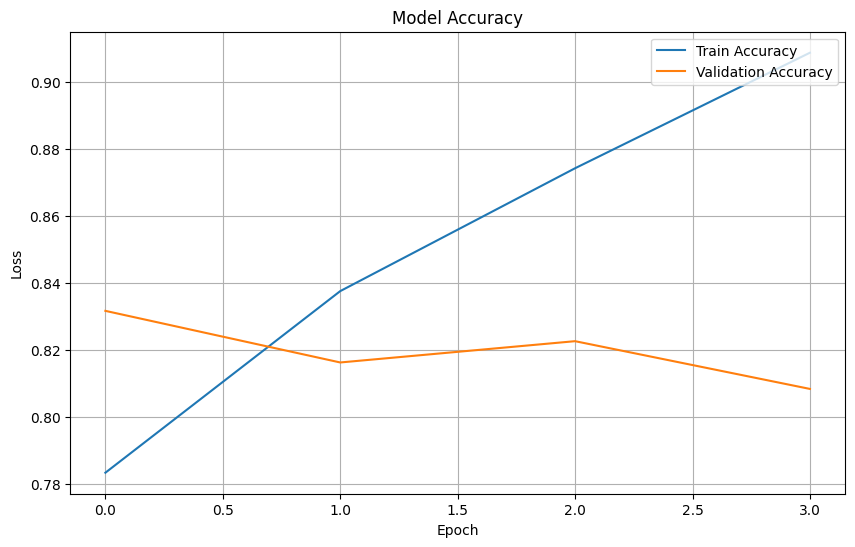

163/163 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step - accuracy: 0.8393 - loss: 0.4117
Validation Loss: 0.4161906838417053
Validation Accuracy: 0.8316316604614258


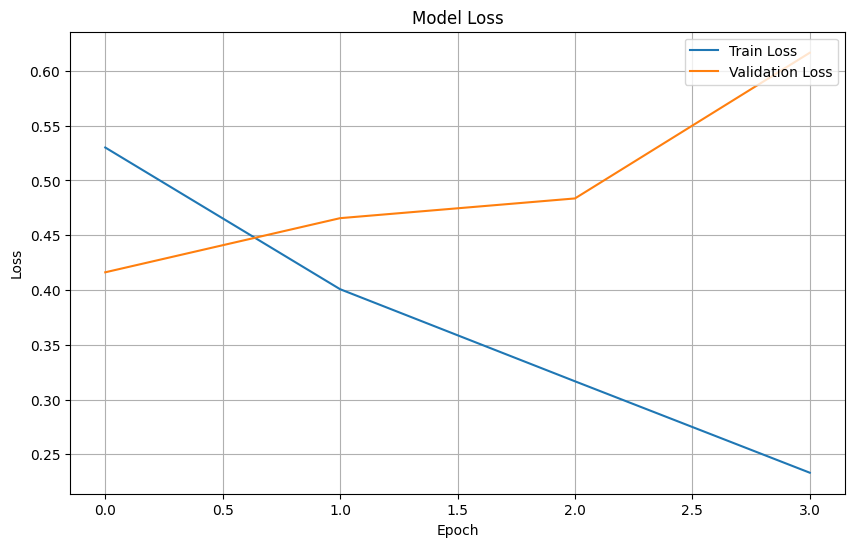

163/163 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step - accuracy: 0.8386 - loss: 0.4121
Validation Loss: 0.4161906838417053
Validation Accuracy: 0.8316316604614258


In [20]:
plot_acc(history)
plot_loss(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


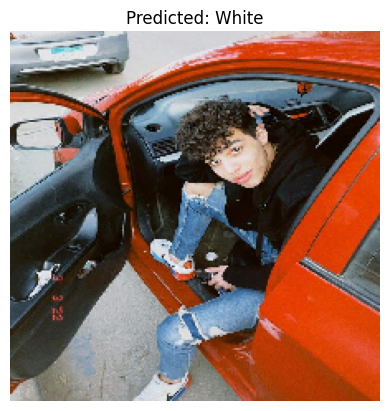

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


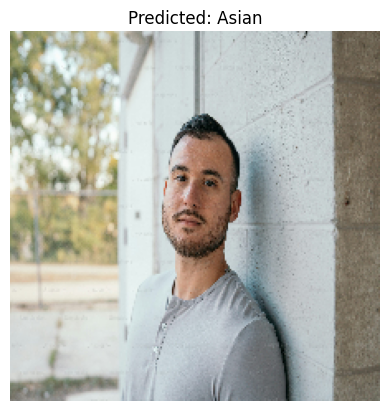

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


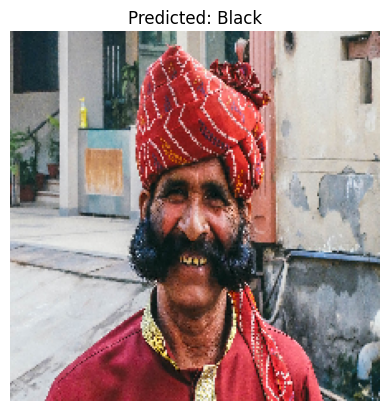

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


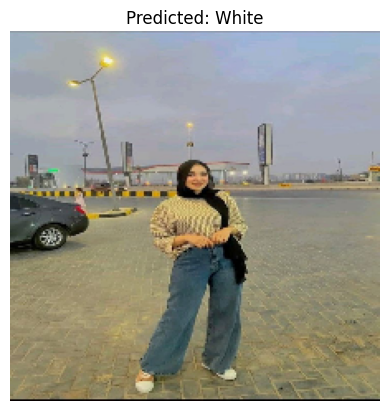

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


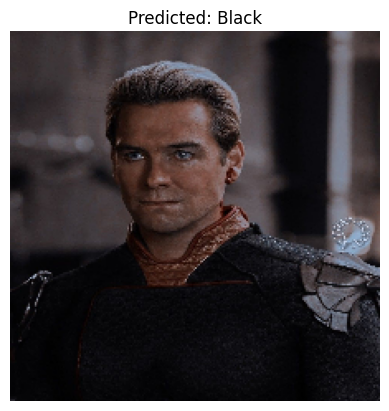

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


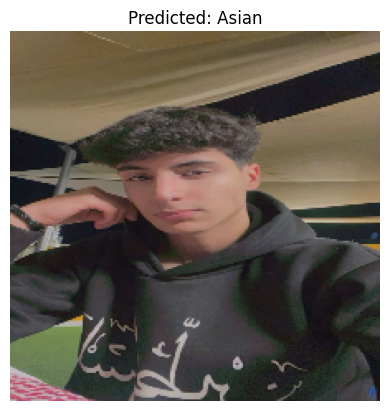

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


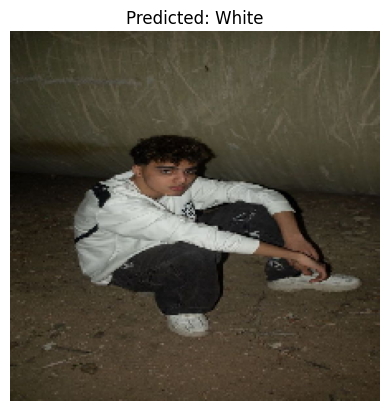

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


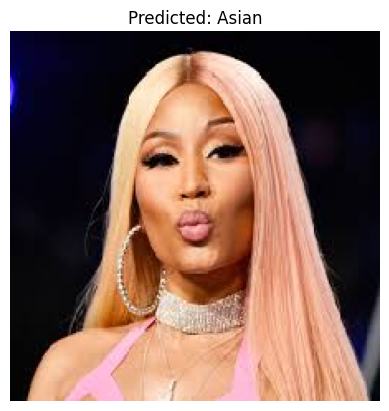

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


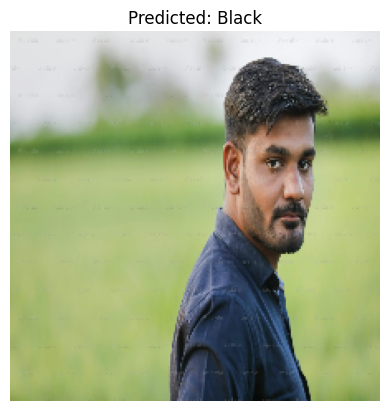

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


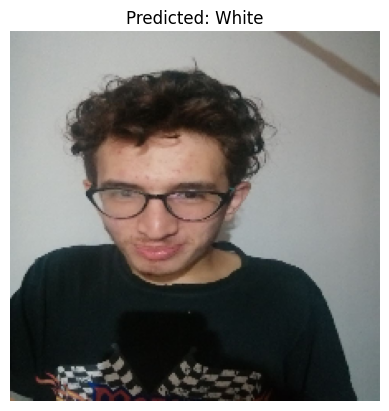

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


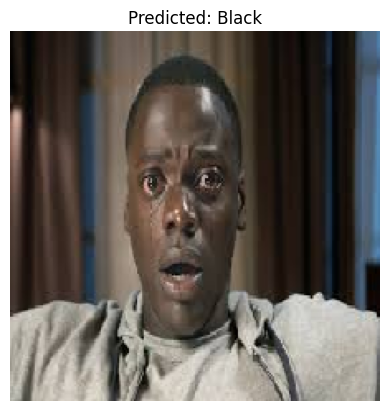

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


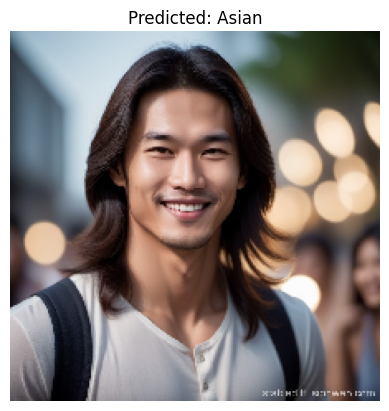

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


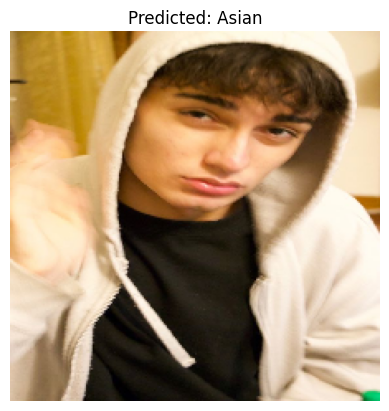

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


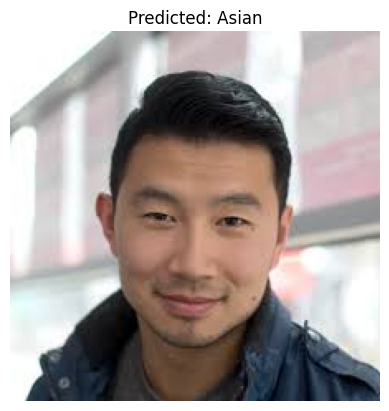

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


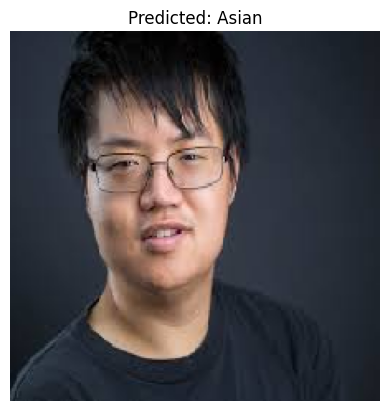

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


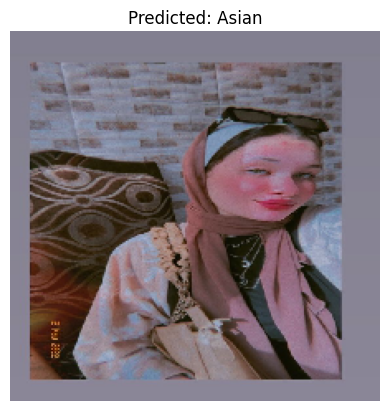

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


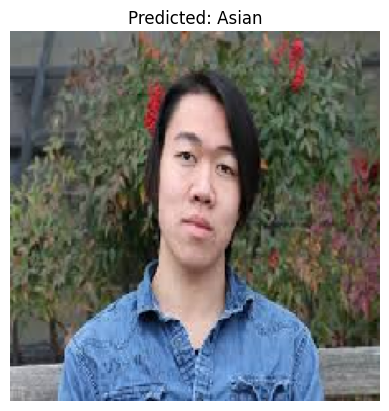

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


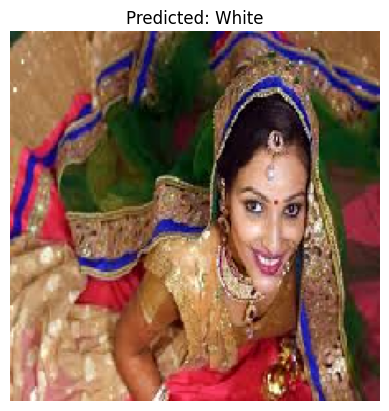

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


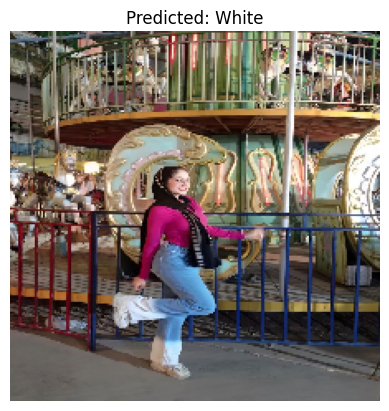

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


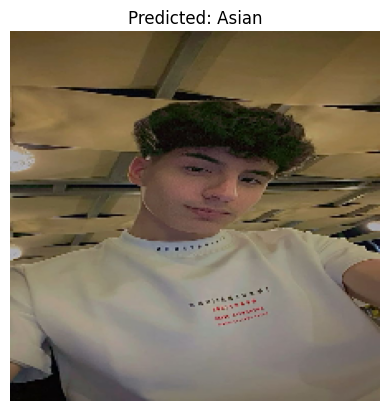

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


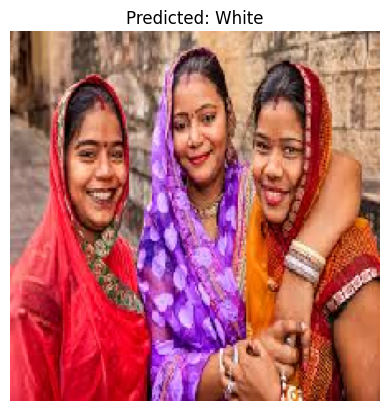

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


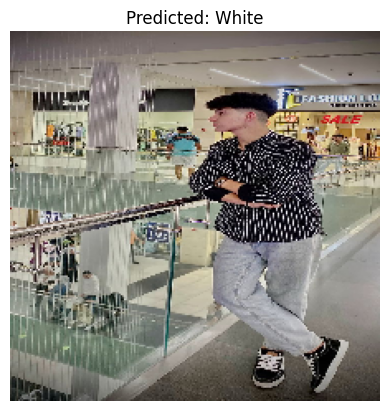

Image: 513.jpg, Predicted Label: White
Image: white-asshole.jpeg, Predicted Label: Asian
Image: indian4.jpg, Predicted Label: Black
Image: 601.jpg, Predicted Label: White
Image: homelander11-2.jpg, Predicted Label: Black
Image: 509.jpg, Predicted Label: Asian
Image: 515.jpg, Predicted Label: White
Image: nicky.jpeg, Predicted Label: Asian
Image: indian1.jpeg, Predicted Label: Black
Image: fadi.jpg, Predicted Label: White
Image: black-nigga.jpeg, Predicted Label: Black
Image: asian-narrow.jpg, Predicted Label: Asian
Image: 502.jpg, Predicted Label: Asian
Image: assian4.jpeg, Predicted Label: Asian
Image: assian.jpeg, Predicted Label: Asian
Image: 602.jpg, Predicted Label: Asian
Image: assian3.jpeg, Predicted Label: Asian
Image: indian3.jpeg, Predicted Label: White
Image: 600.jpg, Predicted Label: White
Image: 510.jpg, Predicted Label: Asian
Image: indian2.jpeg, Predicted Label: White
Image: 511.jpg, Predicted Label: White


In [21]:
image_directory = '/kaggle/input/race-data/' 
image_files = [f for f in os.listdir(image_directory) if f.endswith(('png', 'jpg', 'jpeg'))]
results = []
class_names_to_include = ['Black','Asian','White']
for image_file in image_files:
    img_path = os.path.join(image_directory, image_file)
    img = image.load_img(img_path, target_size=(224, 224)) 
    img_array = image.img_to_array(img)  
    img_array = np.expand_dims(img_array, axis=0)  
    img_array = img_array / 255.0  
    predictions = model.predict(img_array)
    predicted_class = np.argmax(predictions, axis=-1)
    predicted_label = class_names_to_include[predicted_class[0]]
    results.append((image_file, predicted_label))
    plt.imshow(img)
    plt.title(f'Predicted: {predicted_label}')
    plt.axis('off')
    plt.show()


for img_file, label in results:
    print(f'Image: {img_file}, Predicted Label: {label}')

# **Yolo Integration**

In [22]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 881.3/881.3 kB 22.7 MB/s eta 0:00:00


In [23]:
import ultralytics
from ultralytics import YOLO
yolo_model = YOLO('yolov8m.pt')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 49.7M/49.7M [00:00<00:00, 134MB/s]


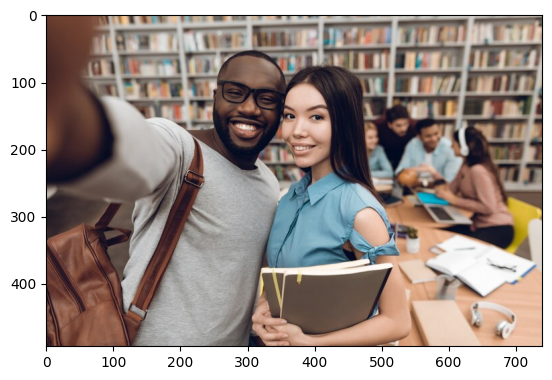

In [24]:
path_image = '/kaggle/input/cat-and-dog/black-asian.jpg'
img_bgr = cv2.imread(path_image)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)


0: 448x640 6 persons, 1 handbag, 1 cup, 3 chairs, 1 laptop, 44.8ms
Speed: 9.3ms preprocess, 44.8ms inference, 247.7ms postprocess per image at shape (1, 3, 448, 640)


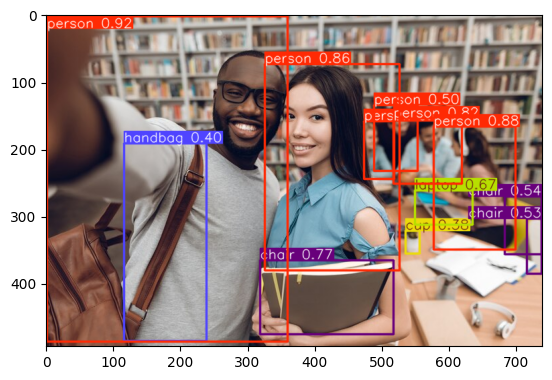

In [25]:
results = yolo_model(img_rgb) 
names = results[0].names
plt.imshow(results[0].plot()) 
plt.show()

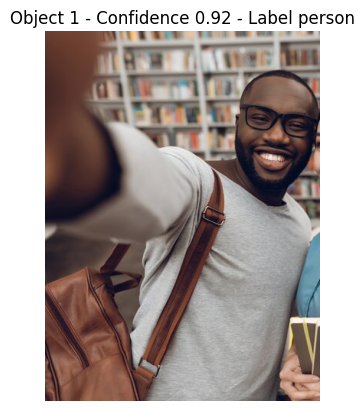

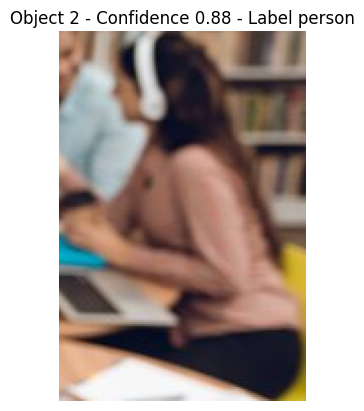

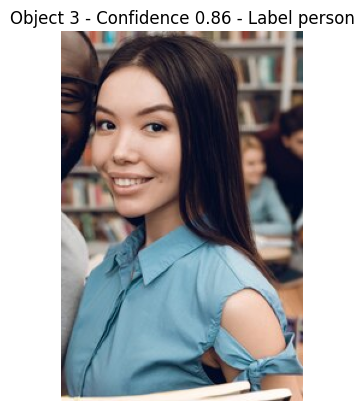

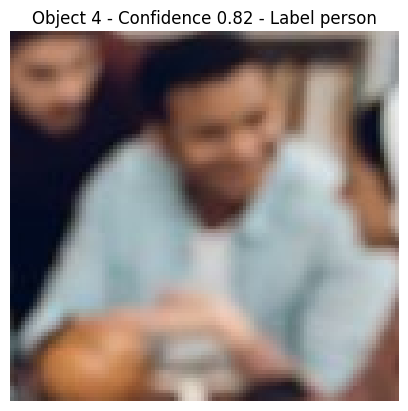

In [26]:
detected_objects = []
confidence = []
labels = []
for box in results[0].boxes:
    # Get bounding box coordinates
    x1, y1, x2, y2 = map(int, box.xyxy[0])  # Coordinates of the box (top-left and bottom-right)
    conf  = np.round(box.conf[0].item(), 2)
    label = names[box.cls[0].item()]
    
    # Check if the label is "person"
    if label == "person" and conf > 0.7 :
        # Crop the object from the original image
        cropped_object = img_rgb[y1:y2, x1:x2]

        # Append to the list of detected objects
        detected_objects.append(cropped_object)
        confidence.append(conf)
        labels.append(label)

# Display the cropped objects for persons
for idx, obj in enumerate(detected_objects):
    plt.figure()
    plt.imshow(obj)
    plt.title(f'Object {idx + 1} - Confidence {confidence[idx]} - Label {labels[idx]}')
    plt.axis('off')
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


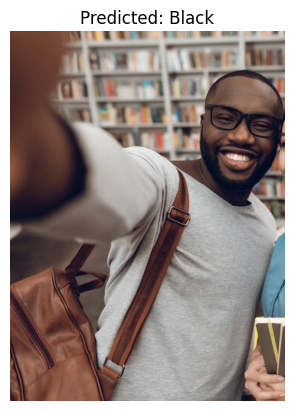

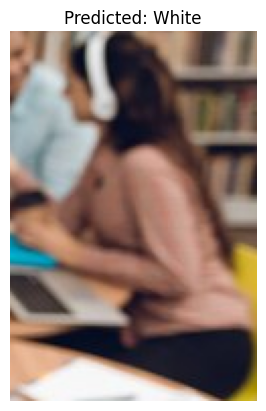

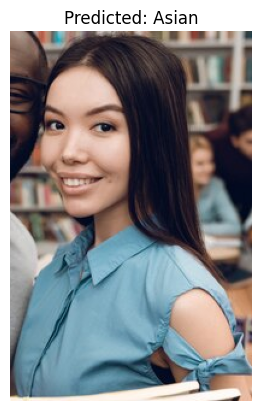

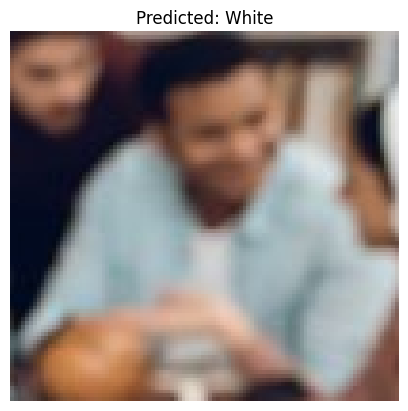

In [27]:
def preprocess_image(img):
    img = image.array_to_img(img)  # Convert array back to image format
    img = img.resize((224, 224))  # Resize to match the model's input size
    img_array = image.img_to_array(img)  # Convert image to array
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = img_array / 255.0  # Normalize the image
    return img_array
predictions = []
for obj in detected_objects:
    # Preprocess the image
    processed_img = preprocess_image(obj)
    preds = model.predict(processed_img)
    
    # Get the predicted class
    predicted_class = np.argmax(preds, axis=-1)
    class_names_to_include = ['Black','Asian', 'White']
    predicted_label = class_names_to_include[predicted_class[0]]
    predictions.append(predicted_label)

# Display the predictions alongside the cropped images
for idx, obj in enumerate(detected_objects):
    plt.figure()
    plt.imshow(obj)
    plt.title(f'Predicted: {predictions[idx]}')
    plt.axis('off')
    plt.show()

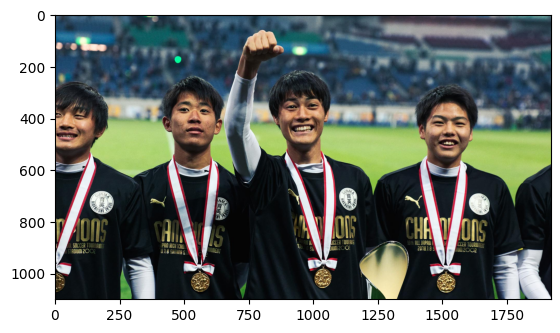

In [28]:
path_image = '/kaggle/input/cat-and-dog/japan.jpg'
img_bgr = cv2.imread(path_image)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)


0: 384x640 5 persons, 1 tie, 1 skis, 1 sports ball, 1 chair, 1 clock, 104.9ms
Speed: 3.4ms preprocess, 104.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


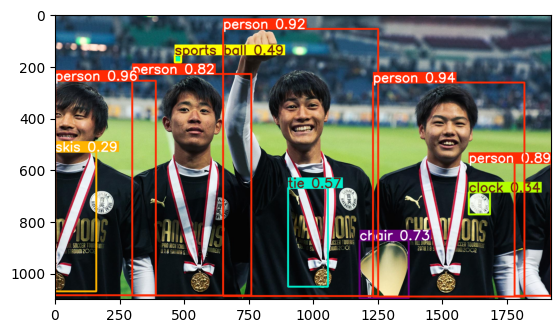

In [29]:
results = yolo_model(img_rgb) 
names = results[0].names
plt.imshow(results[0].plot()) 
plt.show()


In [30]:
detected_objects = []
confidence = []
labels = []
for box in results[0].boxes:
    # Get bounding box coordinates
    x1, y1, x2, y2 = map(int, box.xyxy[0])  # Coordinates of the box (top-left and bottom-right)
    conf  = np.round(box.conf[0].item(), 2)
    label = names[box.cls[0].item()]
    
    # Check if the label is "person"
    if label == "person" and conf > 0.7 :
        # Crop the object from the original image
        cropped_object = img_rgb[y1:y2, x1:x2]

        # Append to the list of detected objects
        detected_objects.append(cropped_object)
        confidence.append(conf)
        labels.append(label)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


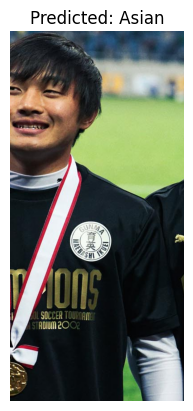

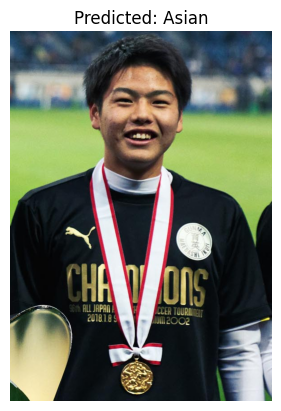

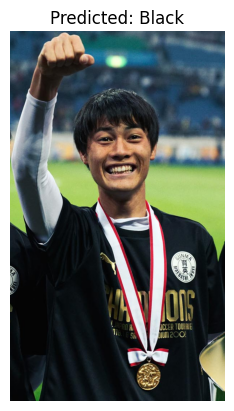

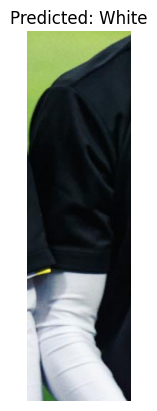

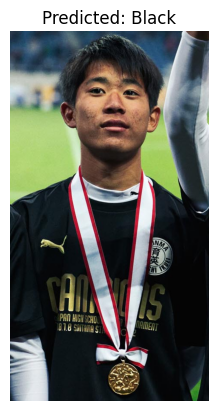

In [31]:
def preprocess_image(img):
    img = image.array_to_img(img)  # Convert array back to image format
    img = img.resize((224, 224))  # Resize to match the model's input size
    img_array = image.img_to_array(img)  # Convert image to array
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = img_array / 255.0  # Normalize the image
    return img_array
predictions = []
for obj in detected_objects:
    # Preprocess the image
    processed_img = preprocess_image(obj)
    preds = model.predict(processed_img)
    
    # Get the predicted class
    predicted_class = np.argmax(preds, axis=-1)
    class_names_to_include = ['Black','Asian', 'White']
    predicted_label = class_names_to_include[predicted_class[0]]
    predictions.append(predicted_label)
for idx, obj in enumerate(detected_objects):
    plt.figure()
    plt.imshow(obj)
    plt.title(f'Predicted: {predictions[idx]}')
    plt.axis('off')
    plt.show()

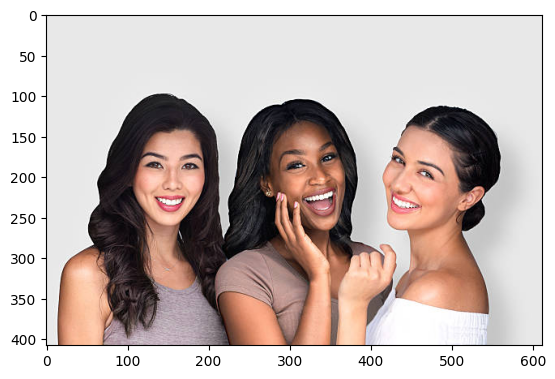

In [32]:
path_image = '/kaggle/input/cat-and-dog/3 women.jpg'
img_bgr = cv2.imread(path_image)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)


0: 448x640 3 persons, 2 cell phones, 13.6ms
Speed: 2.1ms preprocess, 13.6ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


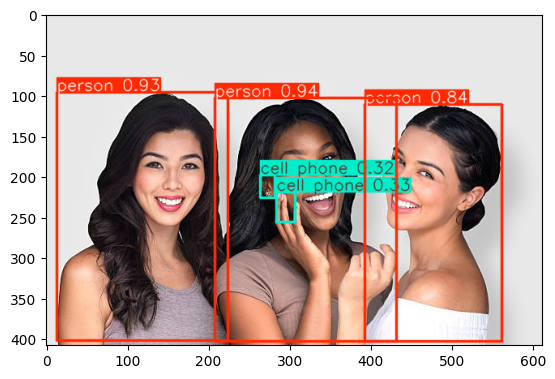

In [33]:
results = yolo_model(img_rgb) 
names = results[0].names
plt.imshow(results[0].plot()) 
plt.show()

In [34]:
detected_objects = []
confidence = []
labels = []
for box in results[0].boxes:
    # Get bounding box coordinates
    x1, y1, x2, y2 = map(int, box.xyxy[0])  # Coordinates of the box (top-left and bottom-right)
    conf  = np.round(box.conf[0].item(), 2)
    label = names[box.cls[0].item()]
    
    # Check if the label is "person"
    if label == "person" and conf > 0.7 :
        # Crop the object from the original image
        cropped_object = img_rgb[y1:y2, x1:x2]

        # Append to the list of detected objects
        detected_objects.append(cropped_object)
        confidence.append(conf)
        labels.append(label)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


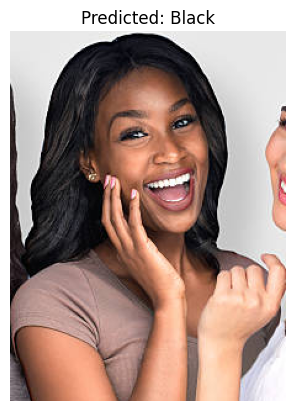

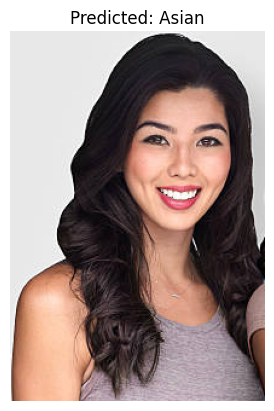

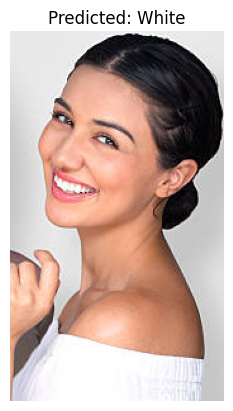

In [35]:
def preprocess_image(img):
    img = image.array_to_img(img)  # Convert array back to image format
    img = img.resize((224, 224))  # Resize to match the model's input size
    img_array = image.img_to_array(img)  # Convert image to array
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = img_array / 255.0  # Normalize the image
    return img_array
predictions = []
for obj in detected_objects:
    # Preprocess the image
    processed_img = preprocess_image(obj)
    preds = model.predict(processed_img)
    
    # Get the predicted class
    predicted_class = np.argmax(preds, axis=-1)
    class_names_to_include = ['Black','Asian', 'White']
    predicted_label = class_names_to_include[predicted_class[0]]
    predictions.append(predicted_label)
for idx, obj in enumerate(detected_objects):
    plt.figure()
    plt.imshow(obj)
    plt.title(f'Predicted: {predictions[idx]}')
    plt.axis('off')
    plt.show()